In [1]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [3]:
!pip install tensorflow==2.15.0

!pip install tensorflow-probability==0.23.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 49.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 35.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 73.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 23.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 4.7 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.16.0
    Uninstalling wrapt-1.16.0:
      Successfully uninstalled wrapt-1.16.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes-0.4.1
  Attempting uninstall: keras
    Found existing installation: keras 3.4.1
    Uninstalling keras-3.4.1:
      Successfully uninstalled keras-3.4.1
  Attempting uninstall: tensorboard
    Found existing installation

In [4]:
import tensorflow as tf
import pandas as pd
import numpy as np
import os
import pathlib
import cv2
import string
from keras import layers, models
import matplotlib.pyplot as plt
from keras import backend as K
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_probability as tfp
tfd = tfp.distributions

In [5]:
image_shape = (256, 256, 3)
latent_space = 256
kernel = 3
padding = 'same'
learning_rate = 0.0001
weight_decay = 6e-8
filter = 16
strides = 1
source_input = layers.Input(shape = image_shape, name = 'source')
target_input = layers.Input(shape = image_shape, name = 'target')

# Model Architecture:

In [6]:
def sampling(args):
  z_mean, z_log_v = args
  batch = tf.shape(z_mean)[0]
  dim = tf.shape(z_mean)[1]
  e = K.random_normal(shape = (batch, dim))
  return z_mean + tf.exp(0.5*z_log_v)*e

In [7]:
def module(inputs, filter, kernel, padding, strides, activation, use_norm, dilation_rate):
    x = inputs
    x = layers.Conv2D(filter, kernel_size = kernel, padding = padding, strides = strides,
                    dilation_rate = dilation_rate)(x)
    x = layers.Activation(activation)(x)
    if use_norm:
        x = layers.GroupNormalization(groups = 1)(x)
    x = layers.Conv2D(filter, kernel_size = kernel, padding = padding, strides = strides,
                      dilation_rate = dilation_rate)(x)
    x = layers.Activation(activation)(x)
    if use_norm:
        x = layers.GroupNormalization(groups = 1)(x)
    x = layers.Conv2D(filter, kernel_size = kernel, padding = padding, strides = strides,
                      dilation_rate = dilation_rate)(x)
    x = layers.Activation(activation)(x)
    if use_norm:
        x = layers.GroupNormalization(groups = 1)(x)
    return x

In [8]:
def convolution(inputs, filters, kernel, padding, strides, activation, use_norm, dilation_rate):
    x = inputs
    x = module(x, filters, kernel, padding, strides, activation, use_norm, dilation_rate)
    y = layers.Conv2D(filters, kernel_size = 1, padding = padding, strides = strides,
                                     activation = activation,)(inputs)
    if use_norm:
      y = layers.GroupNormalization(groups = 1)(y)

    x = layers.maximum([x, y])
    return x

In [9]:
def encoder(inputs, filters, padding, strides, activation, kernel, use_norm, dilation_rate):
    conv = convolution(inputs, filters, kernel, padding, strides, activation, use_norm, dilation_rate)
    return layers.MaxPooling2D()(conv), conv
def decoder(inputs, skip, filters, padding, strides, kernel, activation, use_norm, dilation_rate):
    x = layers.Conv2DTranspose(filters, kernel_size = kernel, padding = padding,
                              strides = 2, activation = activation,)(inputs)
    x = layers.maximum([x, skip])
    x = convolution(x, filters, kernel ,padding, strides, activation, use_norm, dilation_rate)
    return x

## U-NET (GENERATOR) Architecture:

In [10]:
def U_net(inputs, filter, padding, strides, activation, kernel, use_norm, name, weights, latent_space_name):
    x = inputs
    conv1, skip1 = encoder(x, filter, padding, strides, activation[0], kernel, use_norm, 1)
    conv2, skip2 = encoder(conv1, filter*2, padding, strides, activation[0], kernel, use_norm, 1)
    conv3, skip3 = encoder(conv2, filter*4, padding, strides, activation[0], kernel, use_norm, 1)
    conv4, skip4 = encoder(conv3, filter*8, padding, strides, activation[0], kernel, use_norm, 1)
    conv5, skip5 = encoder(conv4, filter*16, padding, strides, activation[0], kernel, use_norm, 1)
    conv6, skip6 = encoder(conv5, filter*32, padding, strides, activation[0], kernel, use_norm, 1)
    conv7, skip7 = encoder(conv6, filter*64, padding, strides, activation[0], kernel, use_norm, 1)
    x = layers.Flatten()(conv6)
    z_mean = tf.keras.layers.Dense(latent_space, name = "z_mean_{}".format(latent_space_name))(x)
    z_log_v = tf.keras.layers.Dense(latent_space, name = "z_log_v_{}".format(latent_space_name))(x)
    x = tf.keras.layers.Lambda(sampling,
                               output_shape = (latent_space,), name = latent_space_name)([z_mean, z_log_v])
    x = layers.Dense(conv7.shape[1]*conv7.shape[2]*conv7.shape[3],
                    kernel_regularizer = tf.keras.regularizers.L2(0.0001),
                    activation = activation[1])(x)
    x = layers.Reshape((conv7.shape[1], conv7.shape[2], conv7.shape[3]))(x)
    dec0 = decoder(x, skip7, filter*64, padding, strides, kernel, activation[1], use_norm, 1)
    dec = decoder(dec0, skip6, filter*32, padding, strides, kernel, activation[1], use_norm, 1)
    dec1 = decoder(dec, skip5, filter*16, padding, strides, kernel, activation[1], use_norm, 1)
    dec2 = decoder(dec1, skip4, filter*8, padding, strides, kernel, activation[1], use_norm, 1)
    dec3 = decoder(dec2, skip3, filter*4, padding, strides, kernel, activation[1], use_norm, 1)
    dec4 = decoder(dec3, skip2, filter*2, padding, strides, kernel, activation[1], use_norm, 1)
    dec5 = decoder(dec4, skip1, filter, padding, strides, kernel, activation[1], use_norm, 1)
    output = layers.Conv2DTranspose(3, kernel_size = kernel, padding = padding,
                                   strides = 1,)(dec5)
    output = layers.Activation('sigmoid')(output)
    m = models.Model(inputs = inputs, outputs = output,
                    name = name)
    if weights:
      if name == 'xTOy':
          m.load_weights('/content/drive/MyDrive/model_weights_GAN/g_target_5_27.h5')
      elif name == 'yTOx':
          m.load_weights('/content/drive/MyDrive/model_weights_GAN/g_source_5_27.h5')
    return m

## Discriminator Architecture:

In [11]:
def Discriminator(inputs, filter, padding, strides, kernel, activation, use_norm,
                 name, weights):
    x = inputs
    conv1, skip1 = encoder(x, filter, padding, strides, activation, kernel, use_norm, 1)
    conv2, skip2 = encoder(conv1, filter*2, padding, strides, activation, kernel, use_norm, 1)
    conv3, skip3 = encoder(conv2, filter*4, padding, strides, activation, kernel, use_norm, 1)
    conv4, skip4 = encoder(conv3, filter*8, padding, strides, activation, kernel, use_norm, 1)
    conv5, skip5 = encoder(conv4, filter*16, padding, strides, activation, kernel, use_norm, 1)
    conv6, skip6 = encoder(conv5, filter*32, padding, strides, activation, kernel, use_norm, 1)
    conv7, skip7 = encoder(conv6, filter*64, padding, strides, activation, kernel, use_norm, 1)
    output1 = layers.Conv2D(1, kernel_size = kernel, padding = padding,
                         strides = 1)(conv5)
    output2 = layers.Conv2D(1, kernel_size = kernel, padding = padding,
                         strides = 1)(conv4)
    output3 = layers.Conv2D(1, kernel_size = kernel, padding = padding,
                         strides = 1)(conv3)
    output = layers.Conv2D(1, kernel_size = kernel, padding = padding, strides = 1,
                           )(conv7)
    output = layers.add([
        output,
        layers.Conv2D(1, kernel_size = kernel, padding = padding,
                      activation = activation)(layers.MaxPooling2D((4, 4))(conv5)),
        layers.Conv2D(1, kernel_size = kernel, padding = padding,
                      activation = activation)(layers.MaxPooling2D((6, 6))(conv4)),
        layers.Conv2D(1, kernel_size = kernel, padding = padding,
                      activation = activation)(layers.MaxPooling2D((11, 11))(conv3))
    ])
    m = models.Model(inputs = inputs, outputs = [output, output1, output2, output3], name = name)
    if weights:
      if name == 'xx':
          m.load_weights('/content/drive/MyDrive/model_weights_GAN/d_source_5_27.h5')
      elif name == 'yy':
          m.load_weights('/content/drive/MyDrive/model_weights_GAN/d_target_5_27.h5')
    return m

In [12]:
g_target = U_net(source_input, filter, padding,
                        strides, ['LeakyReLU', 'relu'], kernel, use_norm = True,
                        name = 'xTOy', weights = False, latent_space_name = 'target_latent_space')
g_source = U_net(target_input, filter, padding, strides,
                       ['LeakyReLU', 'relu'], kernel, use_norm = True,
                       name = 'yTOx', weights = False, latent_space_name = 'source_latent_space')

In [13]:
def losses_normal_disribution(y_true, y_pred):
    dist = tfd.Normal(loc=0., scale=1.)
    return - tf.reduce_mean(dist.log_prob(y_pred))

In [14]:
# discriminator source
d_source = Discriminator(source_input, filter, 'same', 1, kernel, 'LeakyReLU', use_norm = False,
                        name = 'xx', weights = False)
# discriminator target
d_target = Discriminator(target_input, filter, 'same', 1, kernel, 'LeakyReLU', use_norm = False,
                        name = 'yy', weights = False)
d_source.compile(loss = 'mse', optimizer = tf.keras.optimizers.RMSprop(learning_rate = learning_rate,
                                                    weight_decay = weight_decay))
d_target.compile(loss = 'mse', optimizer = tf.keras.optimizers.RMSprop(learning_rate = learning_rate,
                                                    weight_decay = weight_decay))
d_source.trainable = False
d_target.trainable = False
# forward cyclegan
recon_target_forward = g_target(source_input)
d_target_re = d_target(recon_target_forward)
recon_source_forward = g_source(recon_target_forward)
# backward
recon_source_backward = g_source(target_input)
d_source_re = d_source(recon_source_backward)
recon_target_backward = g_target(recon_source_backward)
gan = models.Model(inputs = [source_input, target_input],
                  outputs = [d_target_re, d_source_re,
                            recon_source_forward,
                            recon_target_backward,
                            g_target.get_layer('target_latent_space').output,
                            g_source.get_layer('source_latent_space').output
                             ],
                  name = 'generative_gan')
loss_weights = [2, 1, 0.7, 0.5, 2, 1, 0.7, 0.5, 10, 10, 0.5, 0.5]
losses = ['mse', 'mse', 'mse', 'mse', 'mse', 'mse', 'mse', 'mse', 'mae', 'mae',
          losses_normal_disribution, losses_normal_disribution]
gan.compile(loss = losses,
            optimizer = tf.keras.optimizers.RMSprop(learning_rate = learning_rate,
                                                    weight_decay = weight_decay),
           loss_weights = loss_weights)

In [15]:
gan.output

[[<KerasTensor: shape=(None, 2, 2, 1) dtype=float32 (created by layer 'yy')>,
  <KerasTensor: shape=(None, 8, 8, 1) dtype=float32 (created by layer 'yy')>,
  <KerasTensor: shape=(None, 16, 16, 1) dtype=float32 (created by layer 'yy')>,
  <KerasTensor: shape=(None, 32, 32, 1) dtype=float32 (created by layer 'yy')>],
 [<KerasTensor: shape=(None, 2, 2, 1) dtype=float32 (created by layer 'xx')>,
  <KerasTensor: shape=(None, 8, 8, 1) dtype=float32 (created by layer 'xx')>,
  <KerasTensor: shape=(None, 16, 16, 1) dtype=float32 (created by layer 'xx')>,
  <KerasTensor: shape=(None, 32, 32, 1) dtype=float32 (created by layer 'xx')>],
 <KerasTensor: shape=(None, 256, 256, 3) dtype=float32 (created by layer 'yTOx')>,
 <KerasTensor: shape=(None, 256, 256, 3) dtype=float32 (created by layer 'xTOy')>,
 <KerasTensor: shape=(None, 256) dtype=float32 (created by layer 'target_latent_space')>,
 <KerasTensor: shape=(None, 256) dtype=float32 (created by layer 'source_latent_space')>]

In [16]:
gan.summary()

Model: "generative_gan"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 source (InputLayer)         [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 target (InputLayer)         [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 16)         448       ['source[0][0]']              
                                                                                                  
 conv2d_56 (Conv2D)          (None, 256, 256, 16)         448       ['target[0][0]']              
                                                                                     

In [17]:
def read_images(pathes):
    images = []
    for img in pathes:
        img = cv2.imread(str(img))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (256, 256))
        img = img/255
        images.append(img)
    return np.array(images)

In [27]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [28]:
!unzip /content/drive/MyDrive/Processed_data/processed_train_sample.zip

Streaming output truncated to the last 5000 lines.
  inflating: Dataset/images/testA/ct1018.png  
  inflating: Dataset/images/testA/ct1019.png  
  inflating: Dataset/images/testA/ct1020.png  
  inflating: Dataset/images/testA/ct1028.png  
  inflating: Dataset/images/testA/ct1029.png  
  inflating: Dataset/images/testA/ct1030.png  
  inflating: Dataset/images/testA/ct1038.png  
  inflating: Dataset/images/testA/ct1039.png  
  inflating: Dataset/images/testA/ct1040.png  
  inflating: Dataset/images/testA/ct1048.png  
  inflating: Dataset/images/testA/ct1049.png  
  inflating: Dataset/images/testA/ct1050.png  
  inflating: Dataset/images/testA/ct1058.png  
  inflating: Dataset/images/testA/ct1059.png  
  inflating: Dataset/images/testA/ct1060.png  
  inflating: Dataset/images/testA/ct1068.png  
  inflating: Dataset/images/testA/ct1069.png  
  inflating: Dataset/images/testA/ct1070.png  
  inflating: Dataset/images/testA/ct1078.png  
  inflating: Dataset/images/testA/ct1079.png  
  inflati

In [29]:
source_pathes = np.array(sorted(list(pathlib.Path('/content/Dataset/images/trainA').glob('*.*'))))
target_pathes = np.array(sorted(list(pathlib.Path('/content/Dataset/images/trainB').glob('*.*'))))

In [30]:
import matplotlib.pyplot as plt
def samples(G, start):
    images = G.predict(start, verbose = 0)
    allImages = np.vstack([start, images])
    plt.figure(figsize = (12, 3))
    for i in range(16):
        plt.subplot(2, 8, (i + 1))
        plt.imshow(allImages[i])
    plt.show()

In [31]:
def save_weight(g_target, g_source, d_source, d_target):
    g_target.save_weights('/content/drive/MyDrive/model_weights_GAN/g_target_5_28.h5')
    g_source.save_weights('/content/drive/MyDrive/model_weights_GAN/g_source_5_28.h5')
    d_source.save_weights('/content/drive/MyDrive/model_weights_GAN/d_source_5_28.h5')
    d_target.save_weights('/content/drive/MyDrive/model_weights_GAN/d_target_5_28.h5')

In [32]:
generator = ImageDataGenerator(
    rotation_range = 0.1, width_shift_range = 0.05, height_shift_range= 0.05,
    shear_range = 0.05, zoom_range= 0.3, fill_mode = "constant",
    horizontal_flip = True, vertical_flip = True
)
def data_augmentation(images):
  final_images = []
  for index, value in enumerate(images):
    for i in range(2):
      new_image = generator.flow(np.reshape(value, (1, 256, 256, 3))).next()
      final_images.append(np.reshape(new_image, (256, 256, 3)))
  return np.array(final_images)

In [33]:
def getPatchGan(shape_):
  return np.vstack([tf.ones(shape = shape_),
                            tf.zeros(shape = shape_)])
def ones(shape_):
  return tf.ones(shape = shape_)
def get_normal_samples(batch_size):
  return tf.random.normal(shape = (batch_size, latent_space), mean = 0, stddev = 1)

Epoch: 0/2401
source_discr: 1.6305279731750488, target_discr: 1.804589867591858 source_ADV: 0.3443793701007962, target_ADV: 0.42789357528090477 
recon_target_loss :0.33187711238861084, recon_source_loss: 0.3846922516822815 
Normal Log loss: 19.146623611450195
Source to Target Samples


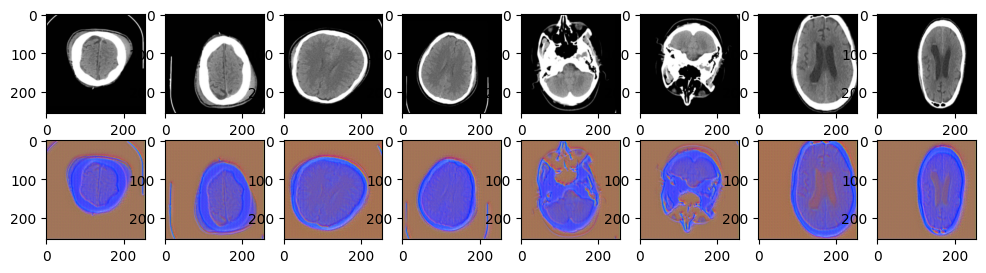

Target to Source Samples


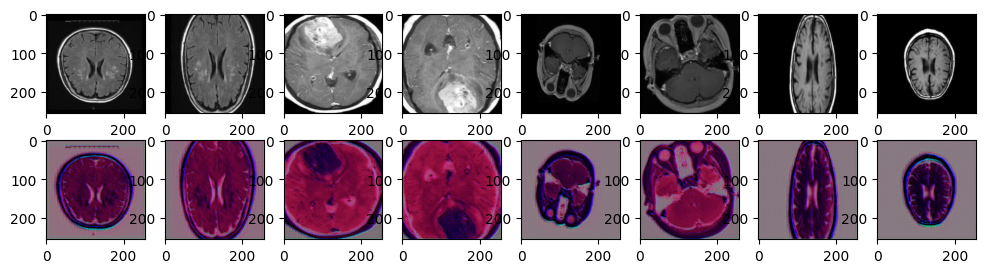

Epoch: 100/2401
source_discr: 0.37430840730667114, target_discr: 0.40560030937194824 source_ADV: 0.6053381413221359, target_ADV: 0.5494857728481293 
recon_target_loss :0.06803399324417114, recon_source_loss: 0.08184506744146347 
Normal Log loss: 2.0313095450401306
Source to Target Samples


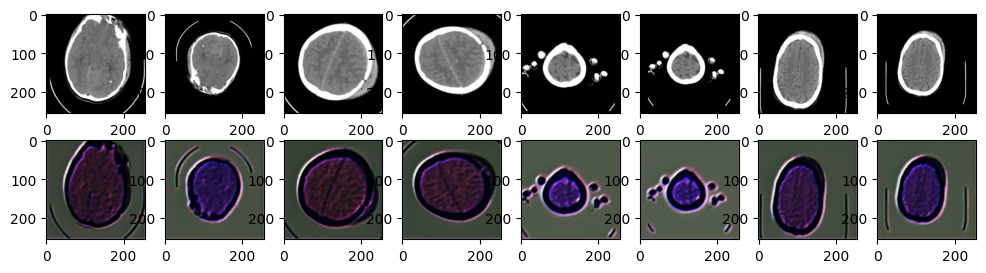

Target to Source Samples


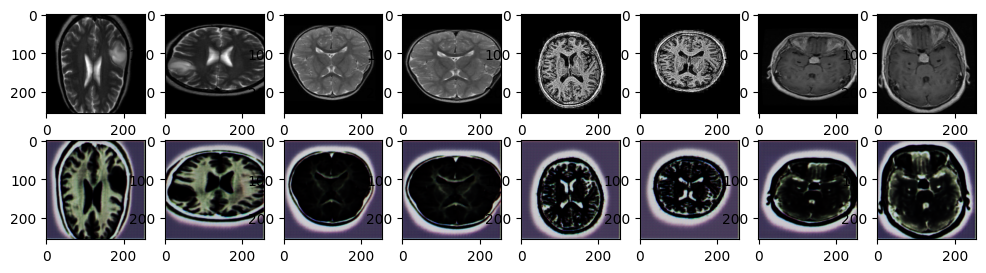

Epoch: 200/2401
source_discr: 0.510452926158905, target_discr: 0.6861573457717896 source_ADV: 0.5196840018033981, target_ADV: 0.9529394656419754 
recon_target_loss :0.08655357360839844, recon_source_loss: 0.1850350797176361 
Normal Log loss: 1.9434611797332764
Source to Target Samples


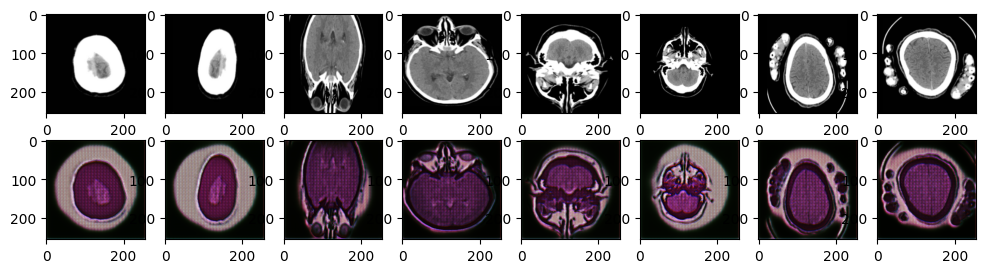

Target to Source Samples


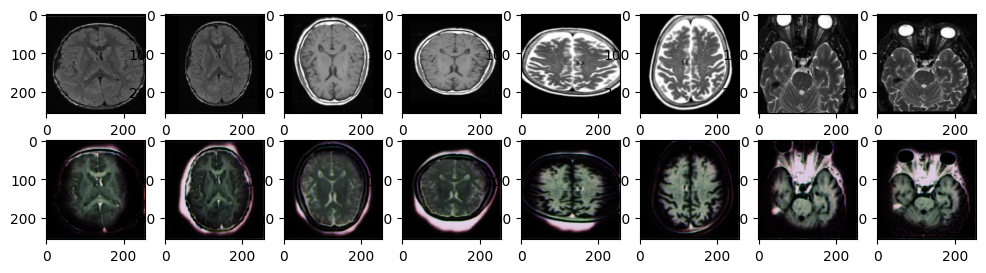

Epoch: 300/2401
source_discr: 0.7684164047241211, target_discr: 0.6749676465988159 source_ADV: 0.6207726448774338, target_ADV: 0.25136660784482956 
recon_target_loss :0.04952613636851311, recon_source_loss: 0.09983846545219421 
Normal Log loss: 1.9116040468215942
Source to Target Samples


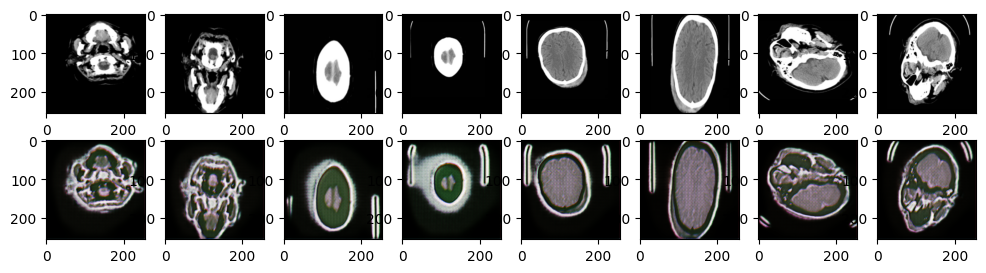

Target to Source Samples


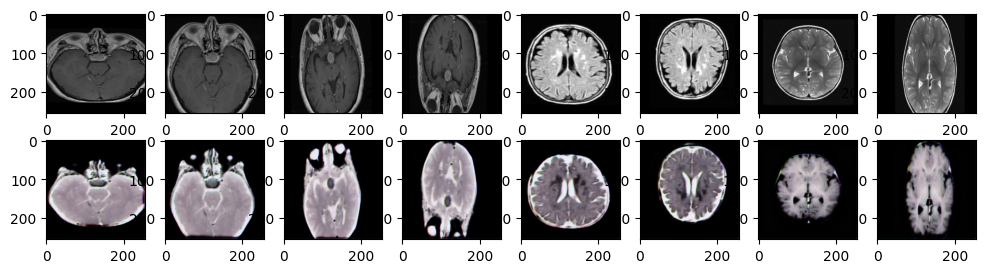

Epoch: 400/2401
source_discr: 0.9226134419441223, target_discr: 0.7877505421638489 source_ADV: 0.4946429058909416, target_ADV: 0.2856741324067116 
recon_target_loss :0.07442906498908997, recon_source_loss: 0.08888658881187439 
Normal Log loss: 1.890254557132721
Source to Target Samples


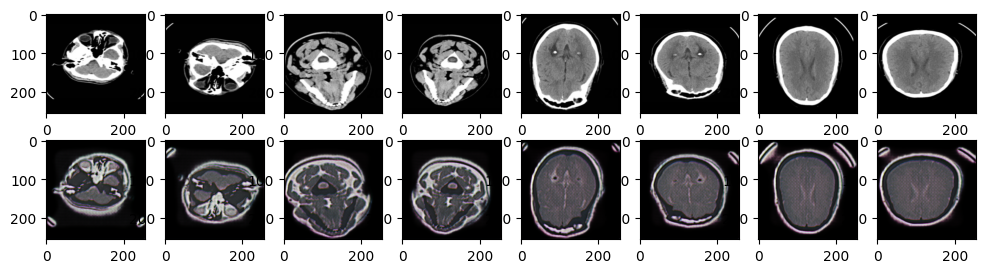

Target to Source Samples


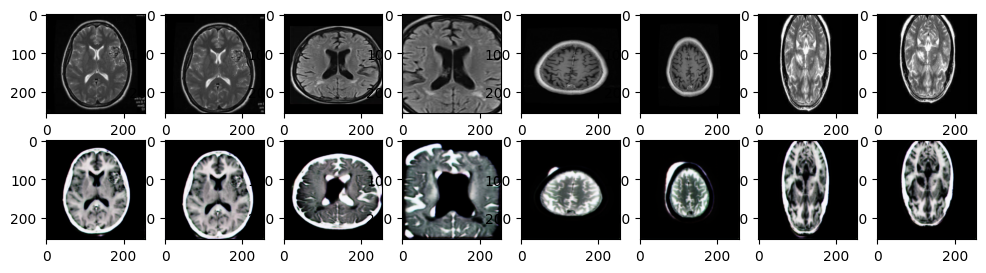

Epoch: 500/2401
source_discr: 0.7371178269386292, target_discr: 0.8669731020927429 source_ADV: 0.7338936775922775, target_ADV: 0.44594481587409973 
recon_target_loss :0.04075334221124649, recon_source_loss: 0.11602146178483963 
Normal Log loss: 1.8812662363052368
Source to Target Samples


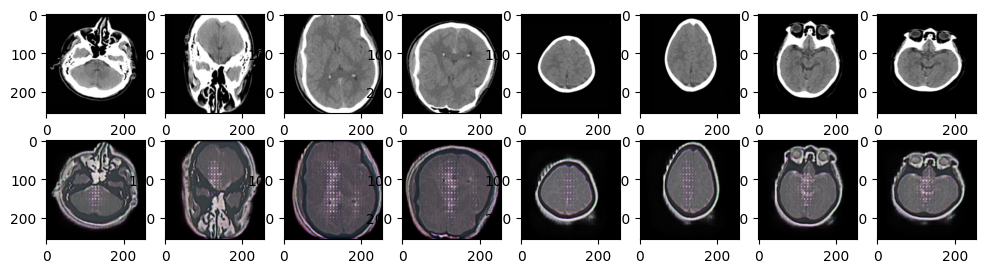

Target to Source Samples


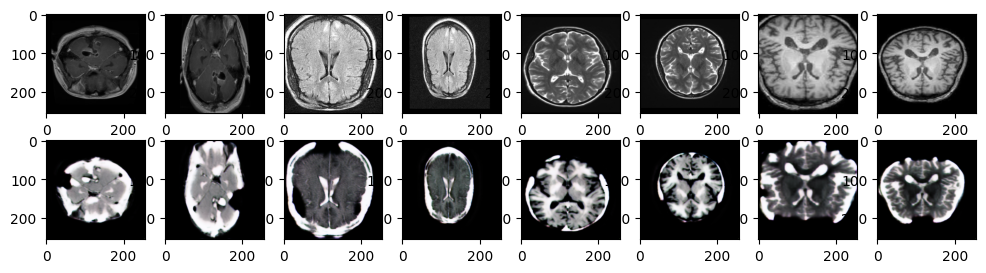

Epoch: 600/2401
source_discr: 0.8601459264755249, target_discr: 0.7239660024642944 source_ADV: 0.10654250159859657, target_ADV: 0.43255503475666046 
recon_target_loss :0.039118073880672455, recon_source_loss: 0.08578483760356903 
Normal Log loss: 1.8917774558067322
Source to Target Samples


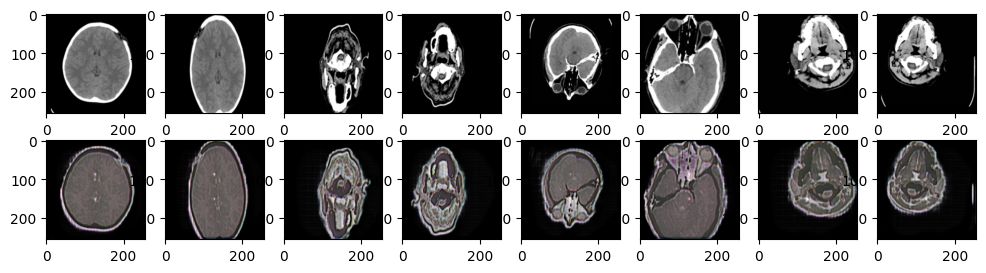

Target to Source Samples


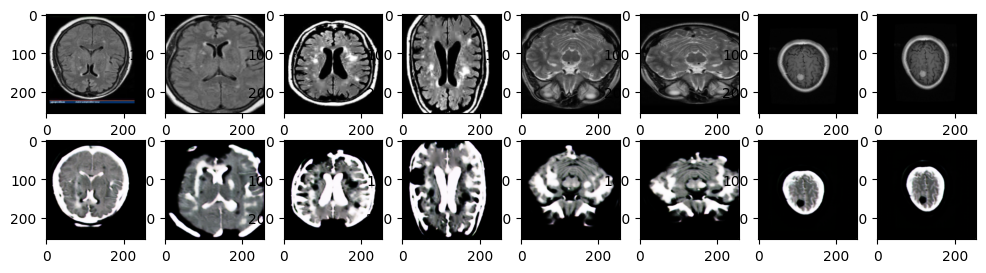

Epoch: 700/2401
source_discr: 0.8820154070854187, target_discr: 0.8139716386795044 source_ADV: 0.18983260169625282, target_ADV: 0.6525912582874298 
recon_target_loss :0.05037587881088257, recon_source_loss: 0.056335702538490295 
Normal Log loss: 1.8867709040641785
Source to Target Samples


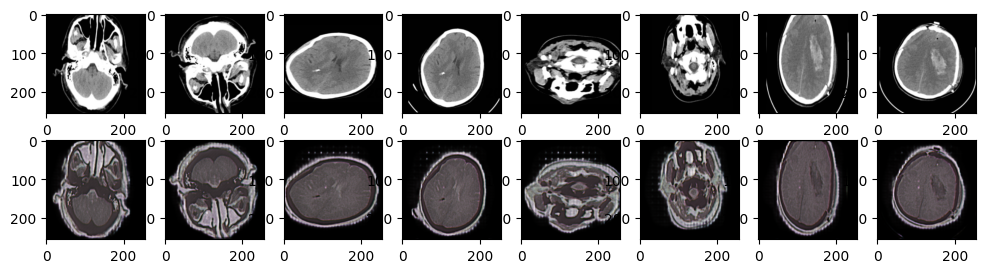

Target to Source Samples


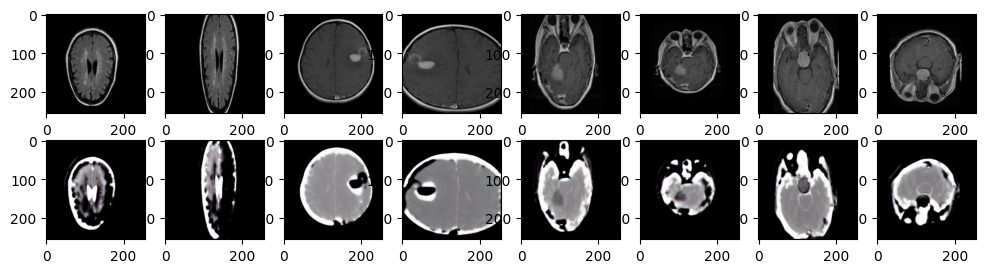

Epoch: 800/2401
source_discr: 1.12917160987854, target_discr: 0.9205950498580933 source_ADV: 0.2732304036617279, target_ADV: 0.15844684839248657 
recon_target_loss :0.03024142235517502, recon_source_loss: 0.07527074962854385 
Normal Log loss: 1.8851622939109802
Source to Target Samples


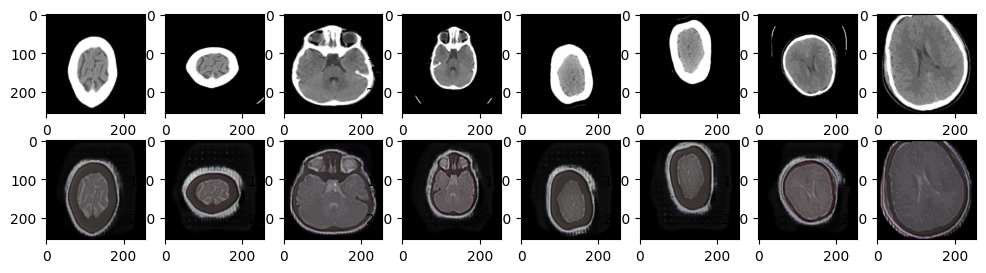

Target to Source Samples


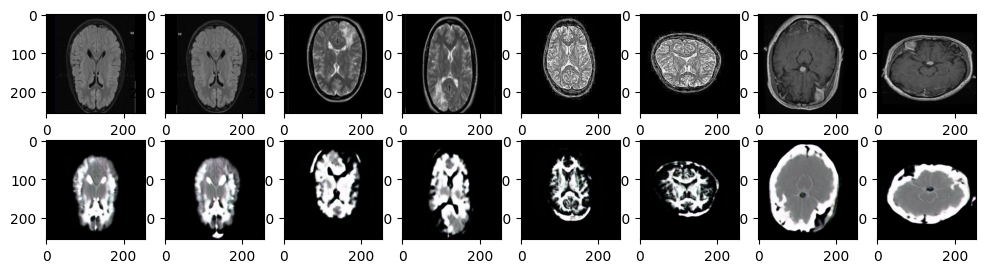

Epoch: 900/2401
source_discr: 0.6375118494033813, target_discr: 0.8746496438980103 source_ADV: 0.38515131175518036, target_ADV: 0.38955092430114746 
recon_target_loss :0.031914714723825455, recon_source_loss: 0.11162824928760529 
Normal Log loss: 1.8922645449638367
Source to Target Samples


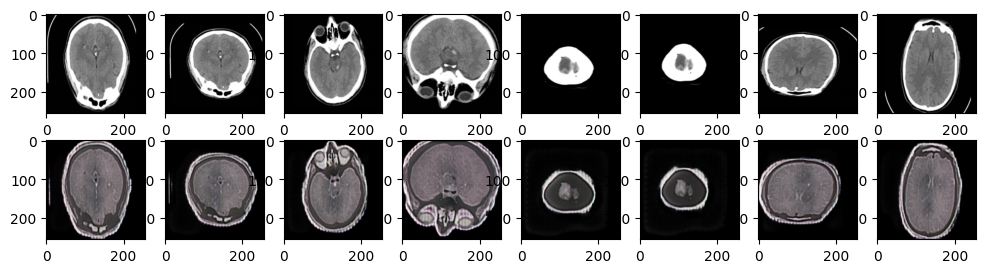

Target to Source Samples


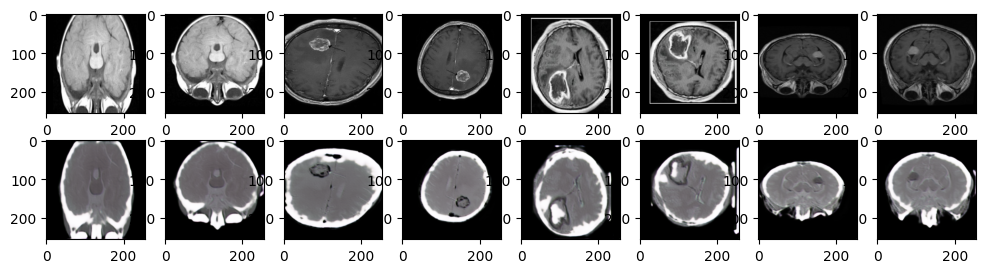

Epoch: 1000/2401
source_discr: 0.9369590282440186, target_discr: 0.7141748666763306 source_ADV: 0.4830847382545471, target_ADV: 0.1335165575146675 
recon_target_loss :0.036967214196920395, recon_source_loss: 0.12932050228118896 
Normal Log loss: 1.8727038502693176
Source to Target Samples


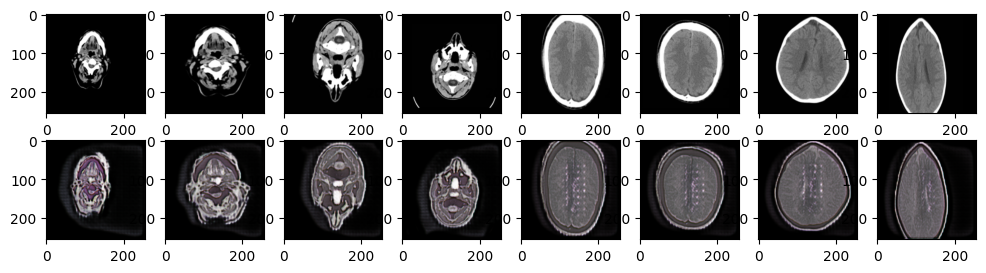

Target to Source Samples


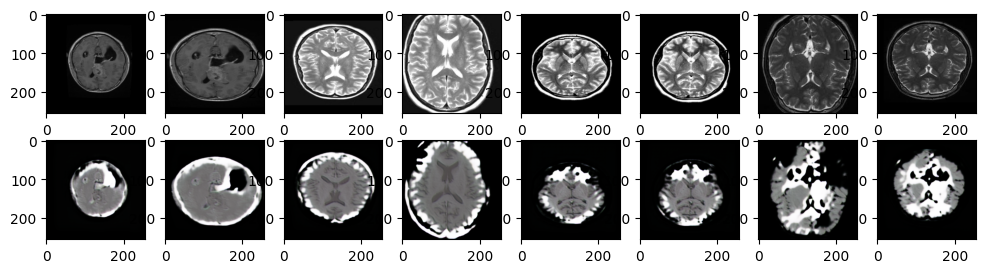

Epoch: 1100/2401
source_discr: 0.8655527830123901, target_discr: 1.0562468767166138 source_ADV: 0.2856627404689789, target_ADV: 0.5433299541473389 
recon_target_loss :0.0482722669839859, recon_source_loss: 0.10924331098794937 
Normal Log loss: 1.8696422576904297
Source to Target Samples


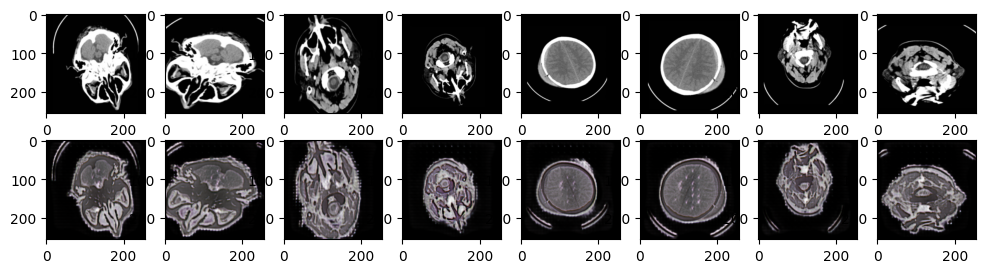

Target to Source Samples


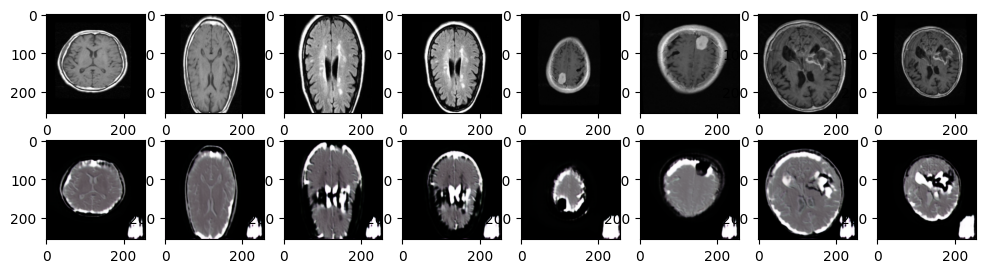

Epoch: 1200/2401
source_discr: 0.6213394999504089, target_discr: 0.9844478368759155 source_ADV: 0.32115745544433594, target_ADV: 0.5860330983996391 
recon_target_loss :0.030428150668740273, recon_source_loss: 0.06346668303012848 
Normal Log loss: 1.8696474432945251
Source to Target Samples


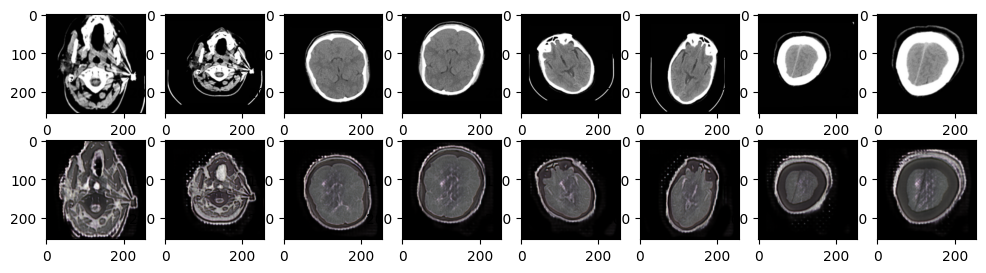

Target to Source Samples


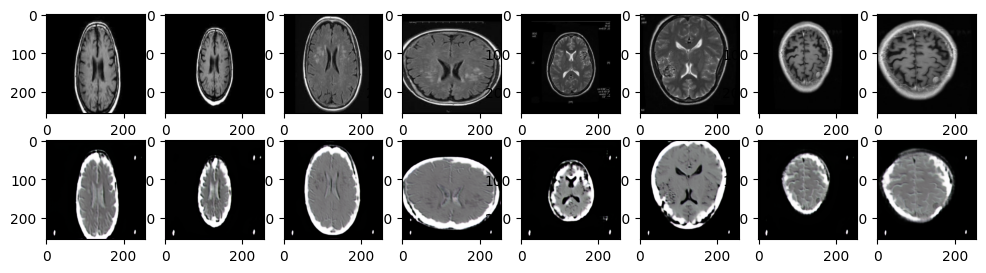

Epoch: 1300/2401
source_discr: 0.7135010361671448, target_discr: 1.100358486175537 source_ADV: 0.44817422330379486, target_ADV: 0.28195636346936226 
recon_target_loss :0.029851363971829414, recon_source_loss: 0.07269060611724854 
Normal Log loss: 1.8617221117019653
Source to Target Samples


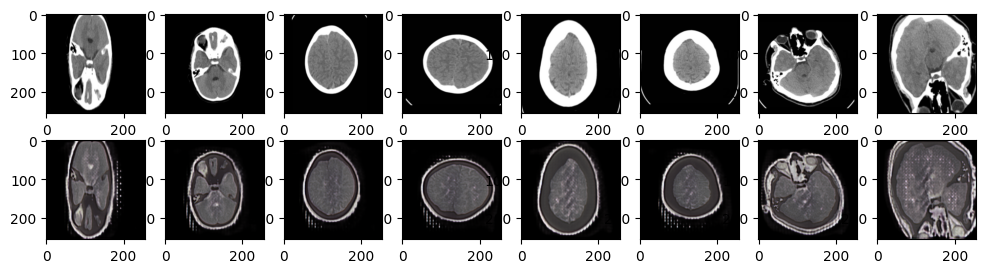

Target to Source Samples


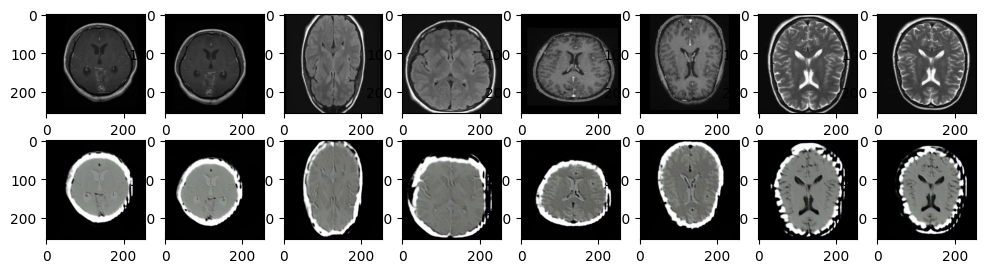

Epoch: 1400/2401
source_discr: 0.5527112483978271, target_discr: 0.8463307619094849 source_ADV: 0.3090098351240158, target_ADV: 0.58552585542202 
recon_target_loss :0.02542142942547798, recon_source_loss: 0.07745538651943207 
Normal Log loss: 1.8651906847953796
Source to Target Samples


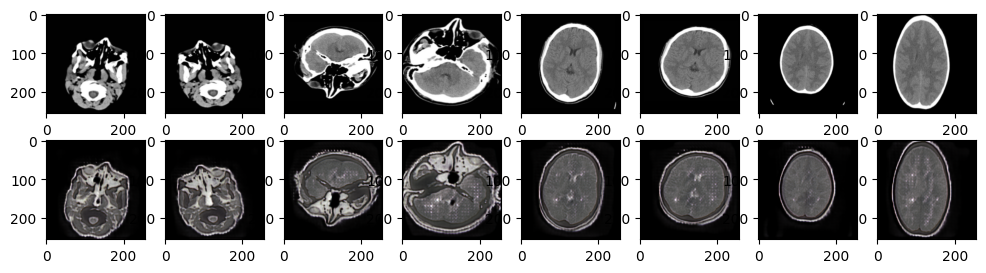

Target to Source Samples


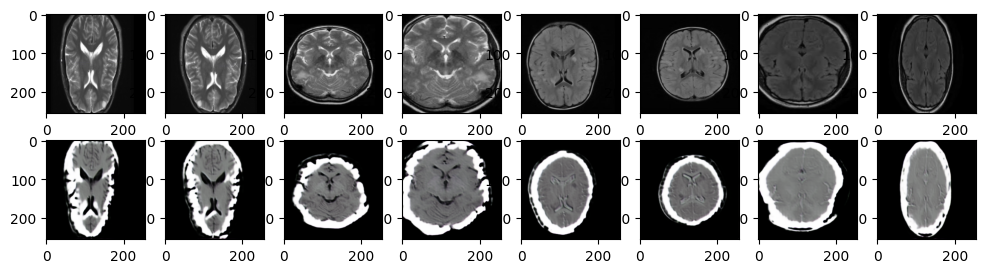

Epoch: 1500/2401
source_discr: 0.7363184094429016, target_discr: 0.7843340039253235 source_ADV: 0.2754537984728813, target_ADV: 0.5490425080060959 
recon_target_loss :0.05770610645413399, recon_source_loss: 0.08956851065158844 
Normal Log loss: 1.8658360838890076
Source to Target Samples


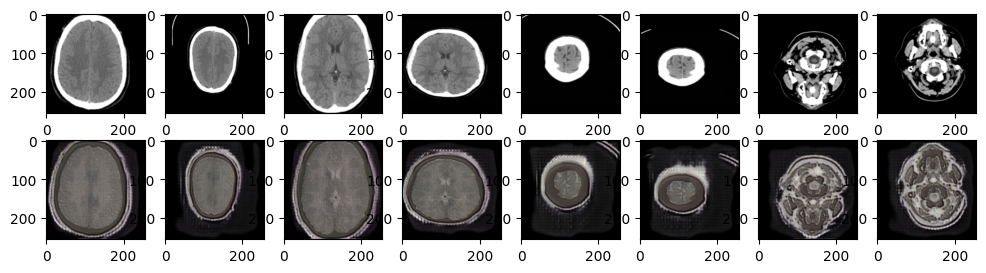

Target to Source Samples


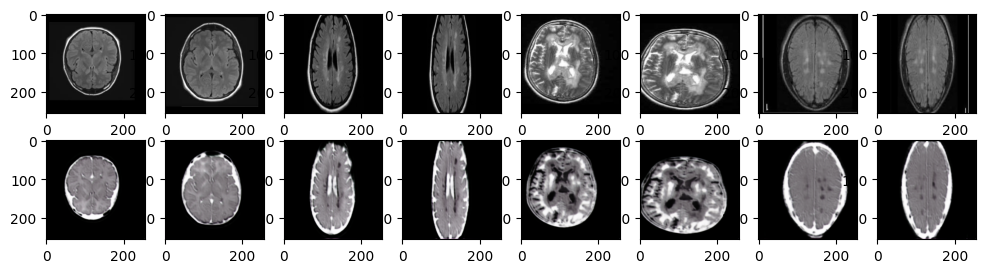

Epoch: 1600/2401
source_discr: 0.5063798427581787, target_discr: 0.7186228632926941 source_ADV: 0.5928004011511803, target_ADV: 0.670489713549614 
recon_target_loss :0.031179552897810936, recon_source_loss: 0.08388914912939072 
Normal Log loss: 1.862522542476654
Source to Target Samples


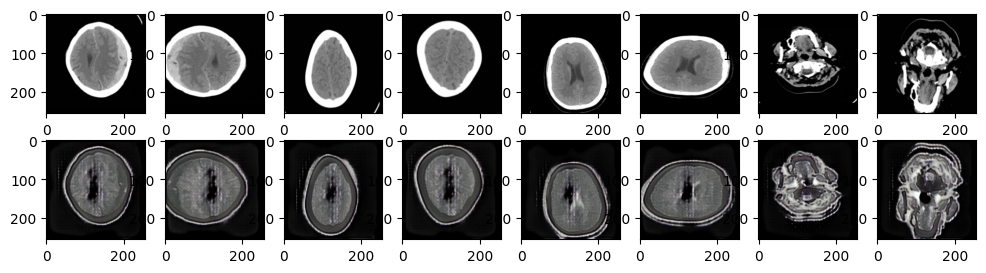

Target to Source Samples


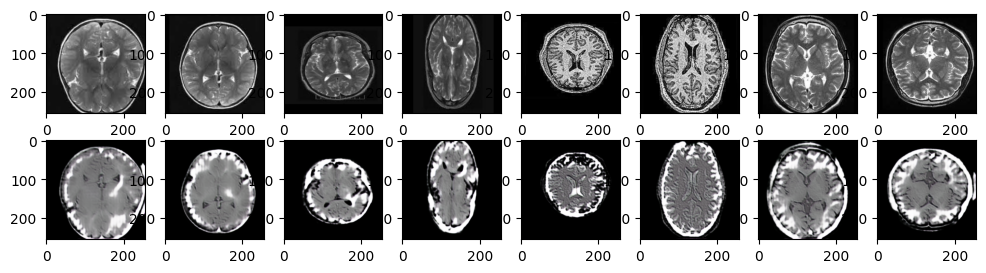

Epoch: 1700/2401
source_discr: 0.5880695581436157, target_discr: 0.6436439156532288 source_ADV: 0.4542582184076309, target_ADV: 0.4504611939191818 
recon_target_loss :0.03268854692578316, recon_source_loss: 0.09590355306863785 
Normal Log loss: 1.8603809475898743
Source to Target Samples


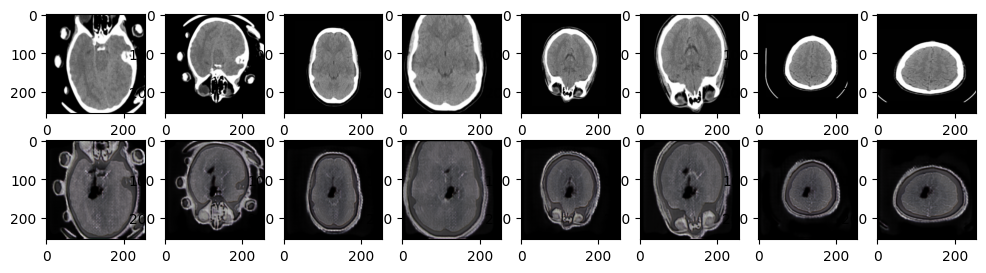

Target to Source Samples


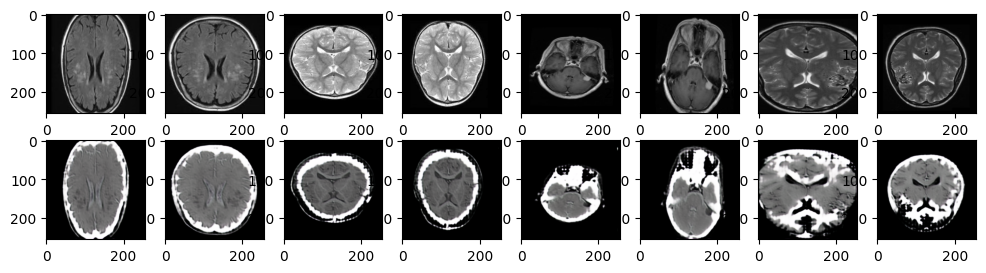

Epoch: 1800/2401
source_discr: 0.26584962010383606, target_discr: 0.7118767499923706 source_ADV: 0.1867448017001152, target_ADV: 0.789368286728859 
recon_target_loss :0.036405567079782486, recon_source_loss: 0.06616415083408356 
Normal Log loss: 1.8573921918869019
Source to Target Samples


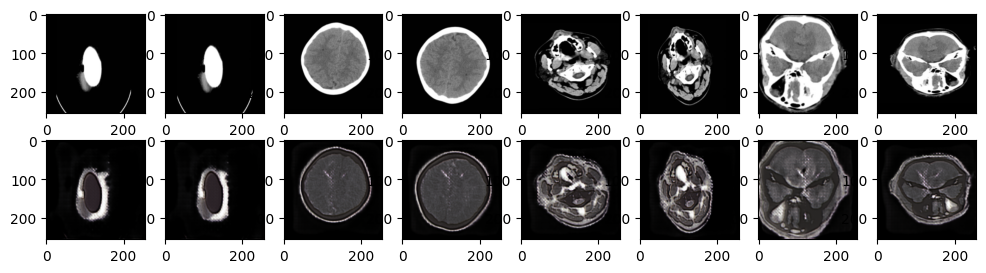

Target to Source Samples


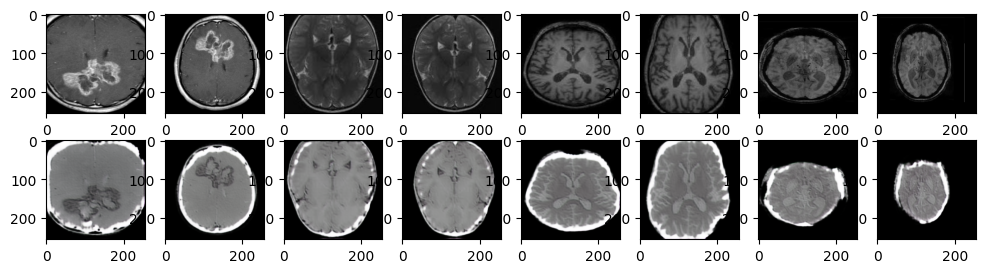

Epoch: 1900/2401
source_discr: 0.8120982050895691, target_discr: 0.853518009185791 source_ADV: 0.49939925223588943, target_ADV: 0.8172771334648132 
recon_target_loss :0.025951404124498367, recon_source_loss: 0.0937168300151825 
Normal Log loss: 1.862320065498352
Source to Target Samples


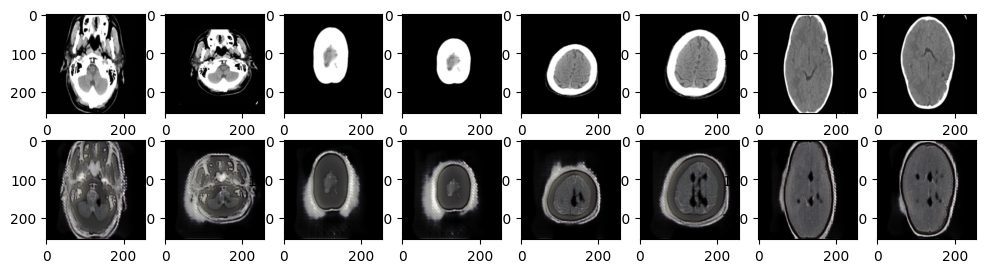

Target to Source Samples


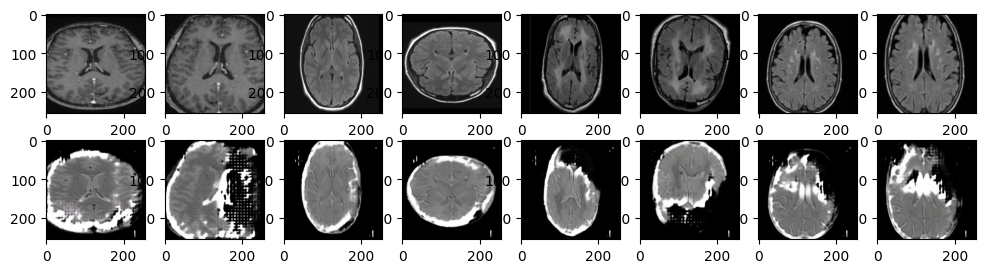

Epoch: 2000/2401
source_discr: 0.5088053345680237, target_discr: 0.8128707408905029 source_ADV: 0.352427713572979, target_ADV: 0.6514853090047836 
recon_target_loss :0.03353140130639076, recon_source_loss: 0.09538618475198746 
Normal Log loss: 1.8603549003601074
Source to Target Samples


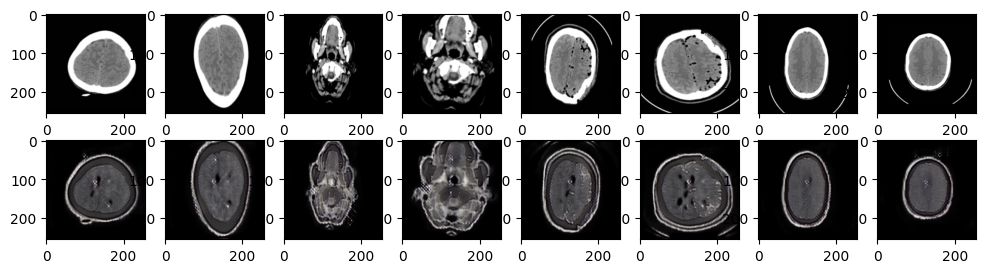

Target to Source Samples


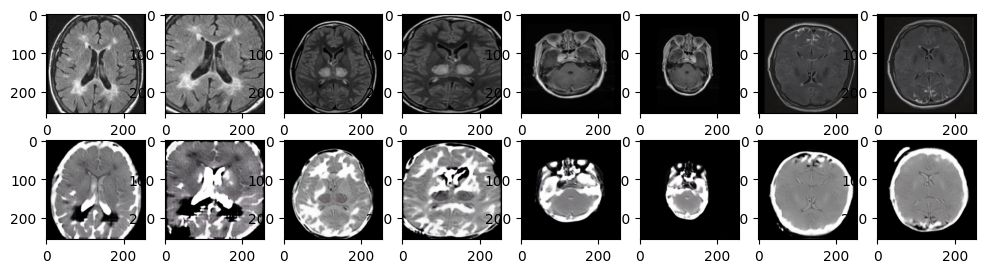

Epoch: 2100/2401
source_discr: 0.46027886867523193, target_discr: 0.6930578351020813 source_ADV: 0.2893287017941475, target_ADV: 0.6387478709220886 
recon_target_loss :0.07575910538434982, recon_source_loss: 0.08534571528434753 
Normal Log loss: 1.8668951988220215
Source to Target Samples


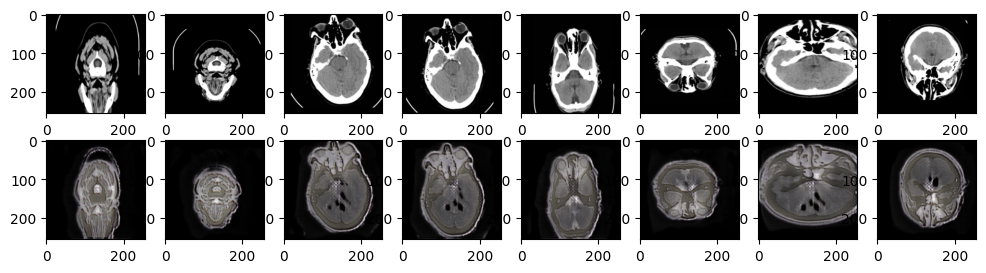

Target to Source Samples


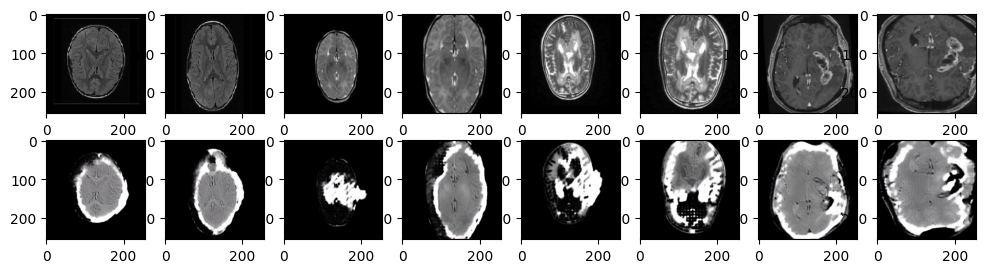

In [ ]:
epochs = 2401
batch_size = 4
batch_after_augmentation = batch_size*2
patchGan = (batch_after_augmentation, 2, 2, 1)
patchGan1 = (batch_after_augmentation, 8, 8, 1)
patchGan2 = (batch_after_augmentation, 16, 16, 1)
patchGan3 = (batch_after_augmentation, 32, 32, 1)
for i in range(epochs):
    indexs = np.random.randint(1740, size = (batch_size,))
    source_images = data_augmentation(read_images(source_pathes[indexs]))
    target_images = data_augmentation(read_images(target_pathes[indexs]))
    real_source = source_images
    real_target = target_images
    fake_source = g_source.predict(real_target, verbose = 0)
    fake_target = g_target.predict(real_source, verbose = 0)
    allImagesSource = np.vstack([real_source, fake_source])
    allImagesTarget = np.vstack([real_target, fake_target])
    all_d_source, d1, d2, d3, d4  = d_source.train_on_batch(allImagesSource, [getPatchGan(patchGan),
                                                                              getPatchGan(patchGan1),
                                                                              getPatchGan(patchGan2),
                                                                              getPatchGan(patchGan3)])
    all_d_target, dt1, dt2, dt3, dt4  = d_target.train_on_batch(allImagesTarget, [getPatchGan(patchGan),
                                                                              getPatchGan(patchGan1),
                                                                              getPatchGan(patchGan2),
                                                                              getPatchGan(patchGan3)])
    all_loss, loss_1_1, loss_1_2, loss_1_3, loss_1_4, loss_2_1, loss_2_2, loss_2_3, loss_2_4, loss_3, loss_4, nloss1, nloss2 = gan.train_on_batch([real_source, real_target],
                                                       [[ones(patchGan),ones(patchGan1), ones(patchGan2), ones(patchGan3)],
                                                       [ones(patchGan),ones(patchGan1), ones(patchGan2), ones(patchGan3)],
                                                       real_source,
                                                       real_target,
                                                       get_normal_samples(batch_after_augmentation),
                                                       get_normal_samples(batch_after_augmentation)])
    if i%200 == 0:
        save_weight(g_target, g_source, d_source, d_target)
    if i%100 == 0:
        print('Epoch: {}/{}'.format(i, epochs))
        str_ = 'source_discr: {}, target_discr: {}'.format(all_d_source, all_d_target)
        str_2 = 'source_ADV: {}, target_ADV: {}'.format((loss_1_1 + loss_1_2 + loss_1_3 + loss_1_4)/4,
                                                            (loss_2_1 + loss_2_2 + loss_2_3 + loss_2_4)/4)
        str_3 = 'recon_target_loss :{}, recon_source_loss: {}'.format(loss_3, loss_4)
        print(str_ + ' ' +str_2 + ' ')
        print(str_3 + ' ')
        print('Normal Log loss: {}'.format((nloss1 + nloss2)))
        print('Source to Target Samples')
        samples(g_target, real_source)
        print('Target to Source Samples')
        samples(g_source, real_target)